# Finding the Circles

Circle 1: x = 883, y = 2222, r = 21
Circle 2: x = 2081, y = 2397, r = 21
Circle 3: x = 883, y = 2339, r = 21
Circle 4: x = 1483, y = 933, r = 21
Circle 5: x = 883, y = 2281, r = 22
Circle 6: x = 1731, y = 2045, r = 22
Circle 7: x = 1533, y = 759, r = 17
Circle 8: x = 284, y = 1107, r = 22
Circle 9: x = 1532, y = 2104, r = 22
Circle 10: x = 334, y = 2690, r = 22
Circle 11: x = 435, y = 641, r = 21
Circle 12: x = 285, y = 758, r = 22
Circle 13: x = 633, y = 1516, r = 21
Circle 14: x = 1683, y = 817, r = 21
Circle 15: x = 1683, y = 759, r = 17
Circle 16: x = 533, y = 2456, r = 22
Circle 17: x = 484, y = 991, r = 21
Circle 18: x = 1532, y = 1575, r = 17
Circle 19: x = 1183, y = 1693, r = 22
Circle 20: x = 334, y = 758, r = 21
Circle 21: x = 633, y = 1751, r = 21
Circle 22: x = 2081, y = 1928, r = 22
Circle 23: x = 533, y = 2631, r = 22
Circle 24: x = 1682, y = 1166, r = 21
Circle 25: x = 1533, y = 817, r = 21
Circle 26: x = 1933, y = 759, r = 21
Circle 27: x = 1583, y = 643, r = 17
Circle 

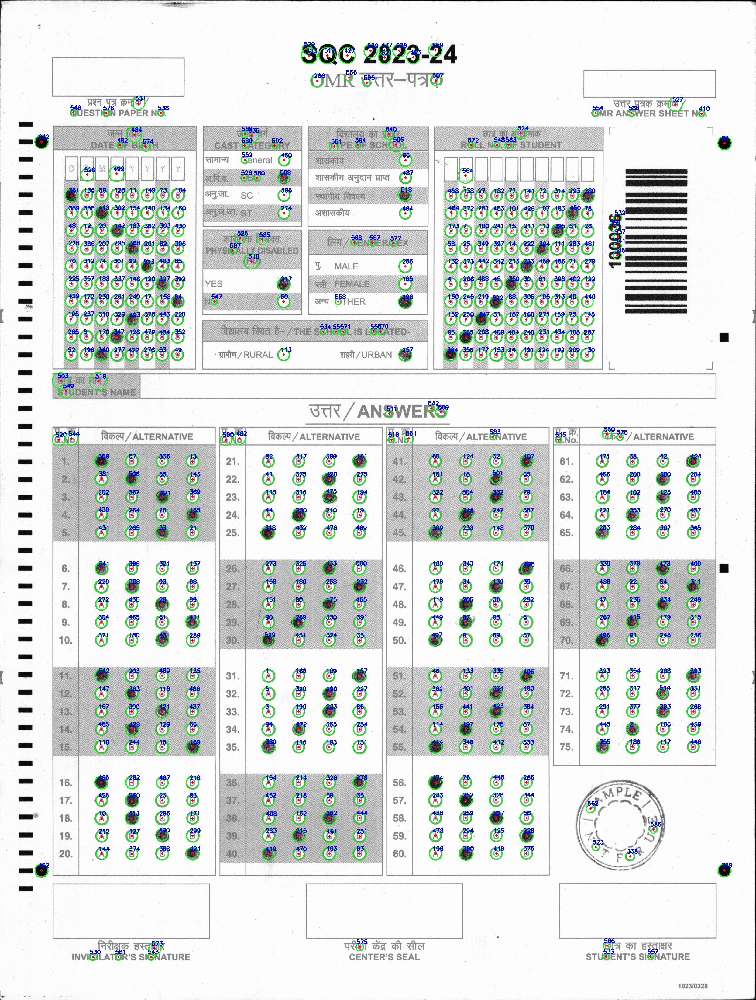

True

In [9]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow  # Use cv2_imshow for Colab

# Load the image (adjust the path to your image file)
image_path = "/content/1.jpg"
img = cv2.imread(image_path)
if img is None:
    raise IOError("Image not found, please check the image path.")

# Convert to grayscale and apply a blur to reduce noise
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = cv2.medianBlur(gray, 5)

# Detect circles using HoughCircles
# Adjust the parameters as needed depending on your image characteristics
circles = cv2.HoughCircles(gray,
                           cv2.HOUGH_GRADIENT,
                           dp=1.2,         # Inverse ratio of accumulator resolution
                           minDist=20,     # Minimum distance between circle centers
                           param1=50,      # Higher threshold for Canny edge detection
                           param2=30,      # Accumulator threshold for circle detection
                           minRadius=10,   # Minimum circle radius
                           maxRadius=30)   # Maximum circle radius

detected_circles = []
if circles is not None:
    # Convert the (x, y, r) coordinates to integers
    circles = np.round(circles[0, :]).astype("int")

    for idx, (x, y, r) in enumerate(circles, start=1):
        detected_circles.append((x, y, r))

        # Draw the circle outline
        cv2.circle(img, (x, y), r, (0, 255, 0), 2)
        # Draw the center of the circle
        cv2.circle(img, (x, y), 2, (0, 0, 255), 3)
        # Put the circle number near the circle
        cv2.putText(img, str(idx), (x - 10, y - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
else:
    print("No circles were detected.")

# Print the coordinates of detected circles
for i, (x, y, r) in enumerate(detected_circles, start=1):
    print(f"Circle {i}: x = {x}, y = {y}, r = {r}")

# Display the result using cv2_imshow (suitable for Colab)
cv2_imshow(img)

# Optionally, save the output image with drawn circles and numbers
# cv2.imwrite("omr_detected_circles.jpg", img)

In [8]:
"""
First omr block:- Date of birth, contain 8 columns where each column conatins 10 circles
Date column format:- DDMMYYYY and D-> first column, D-> second column ... Y->eight column and first circle mean 0 and last circle mean 9
column1 circle number:- [361,389,48,228,70,225,429,195,285,52] # here 361 ,389 .. represent the circle number
column2 circle number:- [136,358,12,386,312,357,172,237,8,198]
column3 circle number:- [89,418,20,207,74,188,239,310,170,340]
column4 circle number:- [128,302,142,295,301,337,261,329,347,277]
column5 circle number:- [11,154,163,368,92,146,240,493,126,422]
column6 circle number:- [149,140,362,201,513,120,17,378,479,276]
column7 circle number:- [73,134,303,62,403,327,158,443,454,53]
column8 circle number:- [104,160,430,306,85,392,64,220,352,49]
"""
"""
Second omr block:- Cast category, contain 4 circles
First circle if Filed Mean General:- [460]
Second circle if Filed Mean OBC:- [508]
Third circle if Filed Mean SC:- [396]
Forth circle if Filed Mean ST:- [274]
"""
"""
Third omr block:- Physically Disabled, contain 2 circles
First circle if Filed Mean yes:- [217]
Second circle if Filed Mean no:- [50]
"""
"""
Forth omr block:- School Location, contain 2 circles
First circle if Filed Mean rural:- [113]
Second circle if Filed Mean urban:- [257]
"""
"""
Fifth omr block:- type of school, contain 4 circles
First circle if Filed Mean shastri:- [96]
Second circle if Filed Mean second school type:- [487]
Third circle if Filed Mean third school type:- [518]
Forth circle if Filed Mean forth school type:- [494]
"""
"""
sixth omr block:- gender/sex, contain 3 circles
First circle if Filed Mean male:- [256]
Second circle if Filed Mean female:- [185]
Third circle if Filed Mean other:- [298]
"""
"""
seven omr block:- answer key, contain 75 columns where each column conatins 4 circles
Date column format:- A B C D and A-> first circle, B-> second circle C-> 3 circle, D-> 4 circle
column1 circle number:- [359,57,336,13]
column2 circle number:- [381,506,55,143]
column3 circle number:- [202,367,491,369]
column4 circle number:- [436,264,28,165]
column5 circle number:- [431,265,33,21]
column6 circle number:- [341,366,321,137]
column7 circle number:- [229,308,93,68]
column8 circle number:- [272,435,29,99]
column9 circle number:- [304,465,61,411]
column10 circle number:- [371,180,43,289]

column11 circle number:- [512,203,489,135]
column12 circle number:- [147,383,118,468]
column13 circle number:- [167,390,121,437]
column14 circle number:- [485,428,129,66]
column15 circle number:- [110,244,16,169]
column16 circle number:- [406,282,467,216]
column17 circle number:- [425,260,23,83]
column18 circle number:- [10,413,296,171]
column19 circle number:- [212,127,490,299]
column20 circle number:- [144,374,388,421]

column21 circle number:- [82,417,399,161]
column22 circle number:- [41,375,420,275]
column23 circle number:- [115,316,475,194]
column24 circle number:- [44,230,210,19]
column25 circle number:- [318,432,476,469]
column26 circle number:- [273,325,433,500]
column27 circle number:- [156,189,258,232]
column28 circle number:- [151,80,175,455]
column29 circle number:- [90,269,330,391]
column30 circle number:- [529,451,324,351]

column31 circle number:- [1,166,109,157]
column32 circle number:- [5,320,290,227]
column33 circle number:- [3,190,223,86]
column34 circle number:- [94,472,365,254]
column35 circle number:- [380,116,193,131]
column36 circle number:- [164,214,326,278]
column37 circle number:- [452,218,59,35]
column38 circle number:- [408,162,262,444]
column39 circle number:- [283,215,461,251]
column40 circle number:- [419,470,103,63]

column41 circle number:- [60,124,32,407]
column42 circle number:- [181,18,501,65]
column43 circle number:- [322,504,332,79]
column44 circle number:- [97,348,247,387]
column45 circle number:- [309,238,148,370]
column46 circle number:- [199,343,174,498]
column47 circle number:- [176,34,139,39]
column48 circle number:- [119,205,36,292]
column49 circle number:- [449,67,98,6]
column50 circle number:- [497,9,69,37]

column51 circle number:- [46,133,335,495]
column52 circle number:- [382,401,334,480]
column53 circle number:- [155,441,423,364]
column54 circle number:- [114,197,178,87]
column55 circle number:- [414,346,412,333]
column56 circle number:- [474,76,448,286]
column57 circle number:- [243,252,328,344]
column58 circle number:- [438,259,207,56]
column59 circle number:- [478,294,125,226]
column60 circle number:- [196,360,416,376]

column61 circle number:- [471,38,42,424]
column62 circle number:- [466,200,300,204]
column63 circle number:- [184,102,123,405]
column64 circle number:- [221,353,270,457]
column65 circle number:- [253,284,307,345]
column66 circle number:- [339,379,473,400]
column67 circle number:- [486,22,54,311]
column68 circle number:- [47,235,234,249]
column69 circle number:- [267,415,179,315]
column70 circle number:- [496,91,246,236]

column71 circle number:- [323,354,288,393]
column72 circle number:- [255,217,514,331]
column73 circle number:- [291,377,363,268]
column74 circle number:- [445,2,106,439]
column75 circle number:- [355,186,117,446]
"""


' \nseven omr block:- answer key, contain 75 columns where each column conatins 4 circles\nDate column format:- A B C D and A-> first circle, B-> second circle C-> 3 circle, D-> 4 circle \ncolumn1 circle number:- [] \ncolumn2 circle number:- [] \ncolumn3 circle number:- [] \ncolumn4 circle number:- [] \ncolumn5 circle number:- [] \ncolumn6 circle number:- [] \ncolumn7 circle number:- [] \ncolumn8 circle number:- [] \n'

# Mapping of the circle and also getting their corrdinates

In [ ]:
# Initialize the map
omr_map = {
    "dob": [],
    "cast": [],
    "schooltype": [],
    "pd": [],
    "gender": [],
    "schoollocation": [],
    "answers": []
}

# Circle number to coordinate mapping
circle_coords = {idx: (x, y, r) for idx, (x, y, r) in enumerate(detected_circles, start=1)}

# DOB key (8 columns)
dob_columns = [
    [361, 389, 48, 228, 70, 225, 429, 195, 285, 52],
    [136, 358, 12, 386, 312, 357, 172, 237, 8, 198],
    [89, 418, 20, 207, 74, 188, 239, 310, 170, 340],
    [128, 302, 142, 295, 301, 337, 261, 329, 347, 277],
    [11, 154, 163, 368, 92, 146, 240, 493, 126, 422],
    [149, 140, 362, 201, 513, 120, 17, 378, 479, 276],
    [73, 134, 303, 62, 403, 327, 158, 443, 454, 53],
    [104, 160, 430, 306, 85, 392, 64, 220, 352, 49]
]

# Populate "dob" key
for column in dob_columns:
    omr_map["dob"].append([circle_coords[num] for num in column])

# Cast key
cast_circles = [460, 508, 396, 274]
omr_map["cast"] = [circle_coords[num] for num in cast_circles]

# Schooltype key
schooltype_circles = [96, 487, 518, 494]
omr_map["schooltype"] = [circle_coords[num] for num in schooltype_circles]

# PD key
pd_circles = [217, 50]
omr_map["pd"] = [circle_coords[num] for num in pd_circles]

# Gender key
gender_circles = [256, 185, 298]
omr_map["gender"] = [circle_coords[num] for num in gender_circles]

# Schoollocation key
schoollocation_circles = [113, 257]
omr_map["schoollocation"] = [circle_coords[num] for num in schoollocation_circles]

# Answers key (75 columns)
answer_columns = [
    [359, 57, 336, 13],
    [381, 506, 55, 143],
    [202, 367, 491, 369],
    [436, 264, 28, 165],
    [431, 265, 33, 21],
    [341, 366, 321, 137],
    [229, 308, 93, 68],
    [272, 435, 29, 99],
    [304, 465, 61, 411],
    [371, 180, 43, 289],
    [512, 203, 489, 135],
    [147, 383, 118, 468],
    [167, 390, 121, 437],
    [485, 428, 129, 66],
    [110, 244, 16, 169],
    [406, 282, 467, 216],
    [425, 260, 23, 83],
    [10, 413, 296, 171],
    [212, 127, 490, 299],
    [144, 374, 388, 421],
    [82, 417, 399, 161],
    [41, 375, 420, 275],
    [115, 316, 475, 194],
    [44, 230, 210, 19],
    [318, 432, 476, 469],
    [273, 325, 433, 500],
    [156, 189, 258, 232],
    [151, 80, 175, 455],
    [90, 269, 330, 391],
    [529, 451, 324, 351],
    [1, 166, 109, 157],
    [5, 320, 290, 227],
    [3, 190, 223, 86],
    [94, 472, 365, 254],
    [380, 116, 193, 131],
    [164, 214, 326, 278],
    [452, 218, 59, 35],
    [408, 162, 262, 444],
    [283, 215, 461, 251],
    [419, 470, 103, 63],
    [60, 124, 32, 407],
    [181, 18, 501, 65],
    [322, 504, 332, 79],
    [97, 348, 247, 387],
    [309, 238, 148, 370],
    [199, 343, 174, 498],
    [176, 34, 139, 39],
    [119, 205, 36, 292],
    [449, 67, 98, 6],
    [497, 9, 69, 37],
    [46, 133, 335, 495],
    [382, 401, 334, 480],
    [155, 441, 423, 364],
    [114, 197, 178, 87],
    [414, 346, 412, 333],
    [474, 76, 448, 286],
    [243, 252, 328, 344],
    [438, 259, 207, 56],
    [478, 294, 125, 226],
    [196, 360, 416, 376],
    [471, 38, 42, 424],
    [466, 200, 300, 204],
    [184, 102, 123, 405],
    [221, 353, 270, 457],
    [253, 284, 307, 345],
    [339, 379, 473, 400],
    [486, 22, 54, 311],
    [47, 235, 234, 249],
    [267, 415, 179, 315],
    [496, 91, 246, 236],
    [323, 354, 288, 393],
    [255, 217, 514, 331],
    [291, 377, 363, 268],
    [445, 2, 106, 439],
    [355, 186, 117, 446]
]

# Populate "answers" key
for column in answer_columns:
    omr_map["answers"].append([circle_coords[num] for num in column])

# The resulting map
print(omr_map)

# Now i am addin the rollnumber corrdinates

In [44]:
rollnumber_data = [[(1480, 639, 19), (1481, 695, 17), (1481, 753, 18), (1481, 811, 18), (1481, 869, 17),
        (1481, 927, 17), (1481, 985, 18), (1481, 1043, 18), (1484, 1099, 19), (1483, 1157, 19)],
     [(1532, 638, 17), (1533, 697, 19), (1532, 753, 18), (1532, 811, 18), (1532, 868, 17),
        (1531, 927, 17), (1533, 983, 19), (1529, 1045, 19), (1531, 1101, 17), (1531, 1160, 17)],
     [(1582, 638, 18), (1582, 695, 17), (1582, 753, 17), (1581, 811, 17), (1582, 868, 17),
        (1581, 927, 17), (1582, 985, 17), (1581, 1043, 18), (1583, 1100, 19), (1582, 1159, 17)],
     [(1631, 638, 17), (1631, 694, 18), (1631, 754, 18), (1631, 812, 18), (1631, 869, 18),
        (1631, 926, 18), (1631, 985, 17), (1631, 1043, 18), (1631, 1101, 18), (1630, 1157, 19)],
     [(1679, 638, 19), (1682, 694, 17), (1682, 753, 17), (1679, 811, 19), (1682, 871, 19),
        (1681, 927, 17), (1681, 985, 16), (1682, 1042, 17), (1682, 1101, 18), (1681, 1160, 17)],
     [(1732, 637, 17), (1731, 694, 17), (1731, 753, 18), (1731, 811, 18), (1731, 869, 17),
        (1731, 927, 17), (1731, 985, 17), (1730, 1043, 17), (1730, 1100, 19), (1731, 1159, 17)],
     [(1781, 637, 18), (1783, 697, 19), (1781, 753, 18), (1781, 811, 18), (1781, 868, 17),
        (1780, 927, 17), (1781, 985, 17), (1781, 1042, 18), (1780, 1101, 17), (1781, 1160, 17)],
     [(1832, 637, 17), (1831, 694, 16), (1831, 753, 17), (1833, 812, 19), (1829, 868, 19),
        (1831, 927, 18), (1829, 985, 19), (1833, 1045, 19), (1831, 1100, 18), (1833, 1157, 19)],
     [(1881, 637, 18), (1882, 695, 17), (1882, 753, 17), (1881, 811, 18), (1880, 867, 19),
        (1881, 926, 18), (1882, 985, 18), (1881, 1042, 17), (1882, 1101, 17), (1883, 1161, 19)],
     [(1933, 638, 19), (1930, 695, 18), (1930, 753, 17), (1930, 812, 17), (1930, 868, 17),
         (1931, 927, 17), (1931, 985, 17), (1930, 1043, 17), (1930, 1101, 18), (1930, 1157, 19)]
 ]

# Convert each element in the tuples to np.int32
rollnumber_np = [
    [ (np.int64(x), np.int64(y), np.int64(r)) for (x, y, r) in column ]
    for column in rollnumber_data
]
omr_map["rollnumber"] = rollnumber_np

print(omr_map["rollnumber"])


[[(np.int64(1480), np.int64(639), np.int64(19)), (np.int64(1481), np.int64(695), np.int64(17)), (np.int64(1481), np.int64(753), np.int64(18)), (np.int64(1481), np.int64(811), np.int64(18)), (np.int64(1481), np.int64(869), np.int64(17)), (np.int64(1481), np.int64(927), np.int64(17)), (np.int64(1481), np.int64(985), np.int64(18)), (np.int64(1481), np.int64(1043), np.int64(18)), (np.int64(1484), np.int64(1099), np.int64(19)), (np.int64(1483), np.int64(1157), np.int64(19))], [(np.int64(1532), np.int64(638), np.int64(17)), (np.int64(1533), np.int64(697), np.int64(19)), (np.int64(1532), np.int64(753), np.int64(18)), (np.int64(1532), np.int64(811), np.int64(18)), (np.int64(1532), np.int64(868), np.int64(17)), (np.int64(1531), np.int64(927), np.int64(17)), (np.int64(1533), np.int64(983), np.int64(19)), (np.int64(1529), np.int64(1045), np.int64(19)), (np.int64(1531), np.int64(1101), np.int64(17)), (np.int64(1531), np.int64(1160), np.int64(17))], [(np.int64(1582), np.int64(638), np.int64(18)), (

# Here i am testing the circule and corridnates are overlapping or not

In [54]:
omr_map.keys()

dict_keys(['dob', 'cast', 'schooltype', 'pd', 'gender', 'schoollocation', 'answers', 'rollnumber'])

In [31]:
# Checking the mapping
def draw_circles_on_image(image, circles):
    """
    Draw circles on the image with labels.

    Parameters:
        image (numpy.ndarray): The image on which to draw.
        circles (list of tuples): A list of tuples in the form (x, y, r).

    Returns:
        numpy.ndarray: The image with drawn circles and labels.
    """
    for idx, (x, y, r) in enumerate(circles, start=1):
        # Draw the circle (green circle)
        cv2.circle(image, (x, y), r, (0, 255, 0), 2)
        # Draw the center of the circle (red dot)
        cv2.circle(image, (x, y), 2, (0, 0, 255), 2)
        # Label the circle with its index (blue text)
        cv2.putText(image, str(idx), (x - 10, y - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
    cv2_imshow(image)

In [ ]:
# Testing the cast
image_path = "/content/1.jpg"
img3 = cv2.imread(image_path)
draw_circles_on_image(img3,omr_map['cast'])

In [ ]:
# Testing the pd
image_path = "/content/1.jpg"
img3 = cv2.imread(image_path)
draw_circles_on_image(img3,omr_map['pd'])

In [ ]:
# Testing the schoollocation
image_path = "/content/1.jpg"
img3 = cv2.imread(image_path)
draw_circles_on_image(img3,omr_map['schoollocation'])

In [ ]:
# Testing the schooltype
image_path = "/content/1.jpg"
img3 = cv2.imread(image_path)
draw_circles_on_image(img3,omr_map['schooltype'])

In [ ]:
# Testing the gender
image_path = "/content/1.jpg"
img3 = cv2.imread(image_path)
draw_circles_on_image(img3,omr_map['gender'])

In [ ]:
# Testing the dob
image_path = "/content/1.jpg"
temp=1
for i in omr_map['dob']:
  img3 = cv2.imread(image_path)
  print(f"For column {temp}<--------------------------------------------------------------------------------------->")
  draw_circles_on_image(img3,i)
  temp+=1

In [ ]:
# Testing the answer
image_path = "/content/1.jpg"
temp=1
for i in omr_map['answers']:
  img3 = cv2.imread(image_path)
  print(f"For column {temp}<--------------------------------------------------------------------------------------->")
  draw_circles_on_image(img3,i)
  temp+=1

In [ ]:
# Testing the answer
image_path = "/content/1.jpg"
temp=1
for i in omr_map['rollnumber']:
  img3 = cv2.imread(image_path)
  print(f"For column {temp}<--------------------------------------------------------------------------------------->")
  draw_circles_on_image(img3,i)
  temp+=1